<a href="https://colab.research.google.com/github/lucyintheskypy/get-osm-data-frontend/blob/main/Asia_Korail_Morphometrics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [ ]:
import pandas as pd
import geopandas as gpd
!pip install momepy
import momepy as mm
import pyproj
!pip install osmnx
import osmnx as ox
import libpysal
from shapely.geometry import box
from time import time
!pip install PyDrive
!pip install clustergram
from clustergram import Clustergram
!pip install folium matplotlib mapclassify
import matplotlib.pyplot as plt
from bokeh.io import output_notebook
from bokeh.plotting import show

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 277.8/277.8 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 18.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.2/107.2 kB 1.1 MB/s eta 0:00:00


In [ ]:
"""
Setting for google colab - remove if you use local settings
"""
# The path of your project on google drive
path_project = "/content/drive/MyDrive/cartography msc/Thesis TUM 2024/momepy/"

# Connect colab with your google drive
from google.colab import drive
drive.mount('/content/drive')

# Set the project path as current working directory
import os
os.chdir(path_project)
print("Current files under the working directory:", os.listdir())

Mounted at /content/drive
Current files under the working directory: ['case_studies.csv', 'cache', 'case_studies3.csv', 'Brasilia.gpkg', 'results', '01_morphometrics.ipynb', 'case_studies.gsheet', 'Asu.csv', 'Case_of_studies.gsheet', 'slums.csv', 'morphometrics_slums.ipynb', 'examples.ipynb', 'slums.gsheet', 'Chacarita_morphometrics.ipynb', 'Africa_Katanga_Morphometrics.ipynb', 'Southametica_Bañado Sur_Morphometrics.ipynb', 'Asia_Korail_Morphometrics.ipynb']


# Usage of osmnx to get the data for example and after preprocessing of building layer will generate tessellation layer.

In [ ]:
point = (23.784425, 90.408570)
dist = 700
gdf = ox.geometries.geometries_from_point(point, dist=dist, tags={'building':True})
gdf2 = ox.geometries.geometries_from_point(point, dist=dist, tags={'residential':['irregular_settlement']})
gdf_projected = ox.projection.project_gdf(gdf)
gdf_projected_2 = ox.projection.project_gdf(gdf2)
buildings = gdf_projected[gdf_projected.geom_type.isin(['Polygon', 'MultiPolygon'])]
Korail = gdf_projected_2[gdf_projected_2.geom_type.isin(['Polygon', 'MultiPolygon'])]

buildings['uID'] = mm.unique_id(buildings)
Korail['uID'] = mm.unique_id(Korail)
limit = mm.buffered_limit(buildings)
tessellation = mm.Tessellation(buildings, unique_id='uID', limit=limit).tessellation

<ipython-input-3-5bca909e802b>:3: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  gdf = ox.geometries.geometries_from_point(point, dist=dist, tags={'building':True})
<ipython-input-3-5bca909e802b>:4: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  gdf2 = ox.geometries.geometries_from_point(point, dist=dist, tags={'residential':['irregular_settlement']})
/usr/local/lib/python3.10/dist-packages/geopan

Inward offset...
Generating input point array...
Generating Voronoi diagram...
Generating GeoDataFrame...
Dissolving Voronoi polygons...


<ipython-input-3-5bca909e802b>:13: UserWarning: Tessellation does not fully match buildings. 11 element(s) collapsed during generation - unique_id: {591, 7631, 8850, 8793, 9376, 8674, 8877, 9198, 9325, 9326, 9202}.
  tessellation = mm.Tessellation(buildings, unique_id='uID', limit=limit).tessellation


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bo

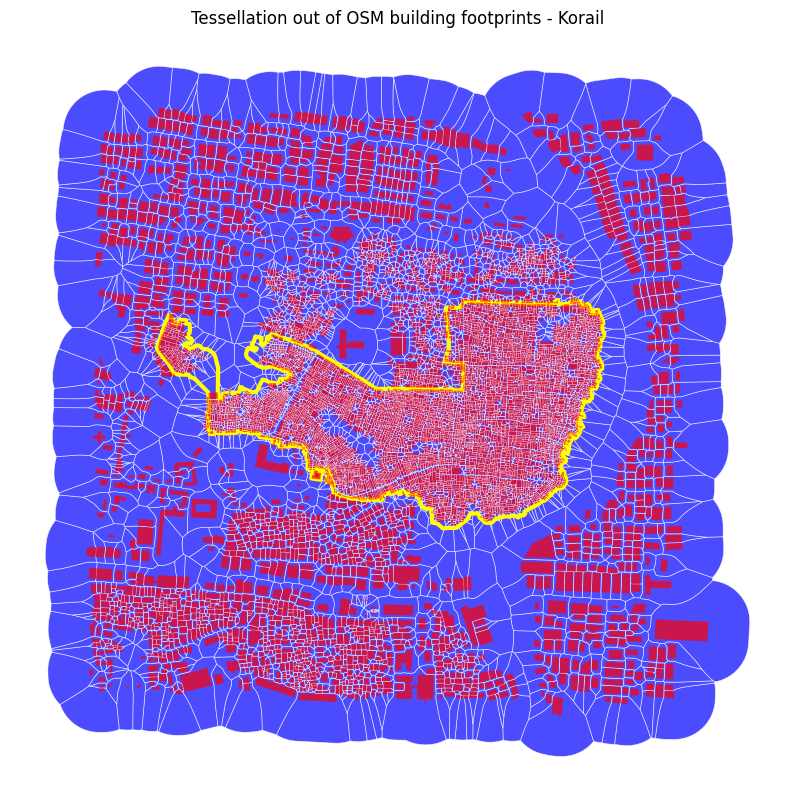

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
tessellation.plot(ax=ax, edgecolor='white', linewidth=0.5, facecolor='blue', alpha=.7)
Korail.plot(ax=ax, edgecolor='yellow', facecolor='none', linewidth=3)
buildings.plot(ax=ax, color='red', alpha=.7)
plt.title('Tessellation out of OSM building footprints - Korail')
ax.set_axis_off()
plt.show()

## Covered Area Ratio

In [ ]:
tessellation['area'] = mm.Area(tessellation).series
buildings['area'] = mm.Area(buildings).series
tess_car = mm.AreaRatio(tessellation, buildings, 'area', 'area', 'uID')
tessellation['CAR'] = tess_car.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
tess_car = mm.AreaRatio(tessellation, buildings,
                            mm.Area(tessellation).series,
                            mm.Area(buildings).series, 'uID')
tessellation['CAR'] = tess_car.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
print(tess_car.series.head())

134      0.055739
697      0.387970
120      0.601259
10178    0.383726
718      0.466501
dtype: float64


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bo

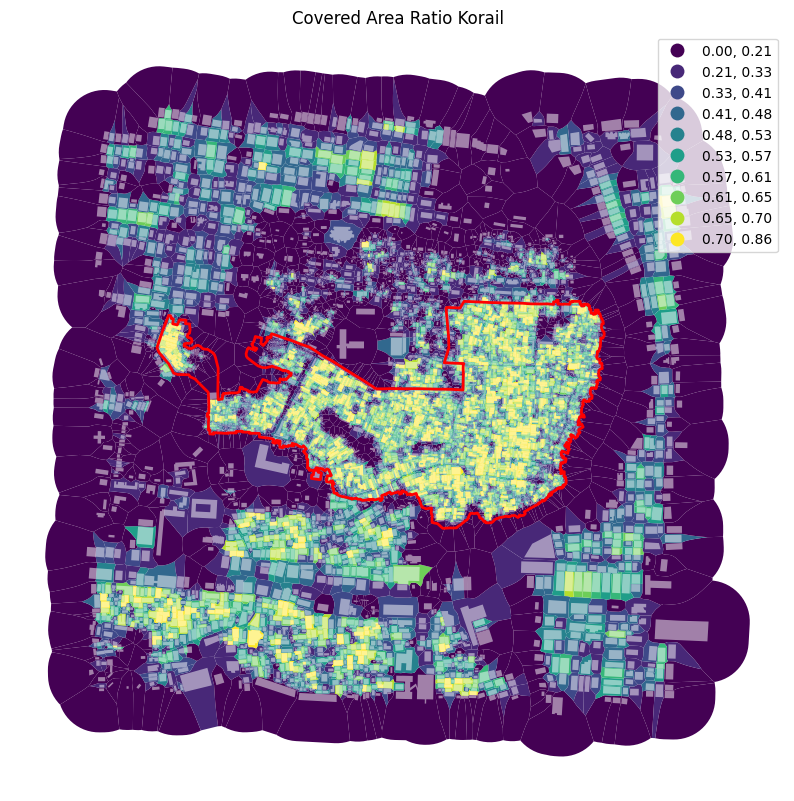

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
tessellation.plot(ax=ax, column='CAR', legend=True, scheme='quantiles', k=10, cmap='viridis')
plt.title('Covered Area Ratio Korail')
buildings.plot(ax=ax, color='white', alpha=0.5)
Korail.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=2)
ax.set_axis_off()
plt.show()

## Areas
Building areas

In [ ]:
blg_area = mm.Area(buildings)
buildings['area'] = blg_area.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


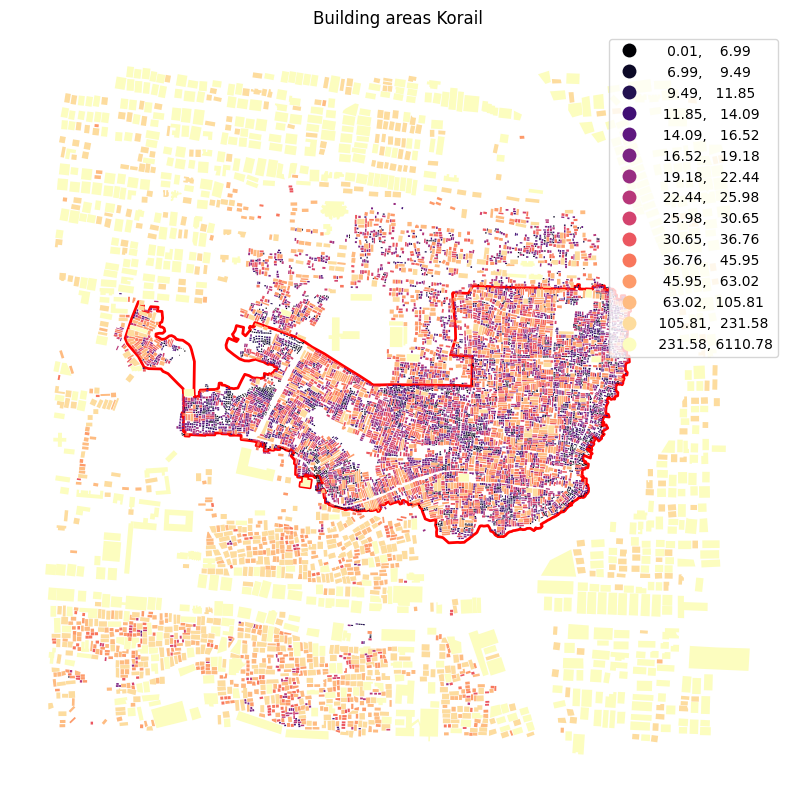

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='area', legend=True, scheme='quantiles', k=15, cmap='magma')
plt.title('Building areas Korail')
ax.set_axis_off()
plt.show()

# Perimeters

In [ ]:
buildings['perimeter'] = mm.Perimeter(buildings).series
buildings.perimeter[0]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


352.73087564296867

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


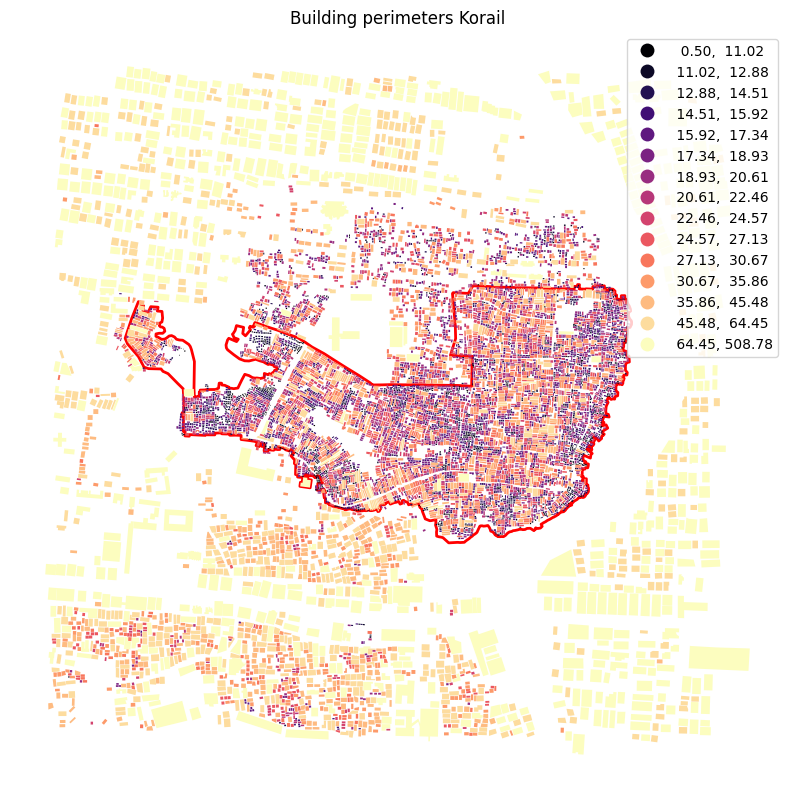

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='perimeter', legend=True, scheme='quantiles', k=15, cmap='magma')
plt.title('Building perimeters Korail')
ax.set_axis_off()
plt.show()

# Tesselation Area

In [ ]:
tes_area = mm.Area(tessellation)
tessellation['area'] = tes_area.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
print(tes_area.series.head())

134      18052.371237
697       1445.738915
120       1333.567369
10178      956.003740
718       1365.745887
dtype: float64


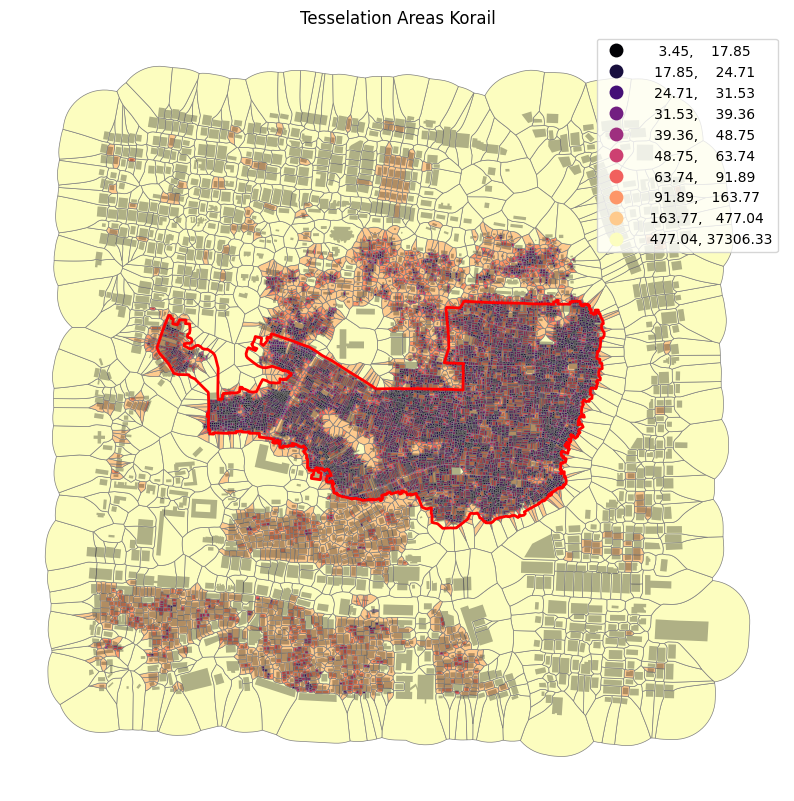

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))

tessellation.plot(ax=ax, edgecolor='grey', linewidth=0.5, column='area', legend=True, scheme='quantiles', k=10, cmap='magma', alpha=1)
buildings.plot(ax=ax, color='black', alpha=.3)
Korail.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=2)
plt.title('Tesselation Areas Korail')

ax.set_axis_off()
plt.show()

# Longest Axis Length

Calculates the length of the longest axis of object. Axis is defined as a diameter of minimal circumscribed circle around the convex hull

In [ ]:
buildings['lal'] = mm.LongestAxisLength(buildings).series
buildings.lal[0]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


137.57359982368334

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


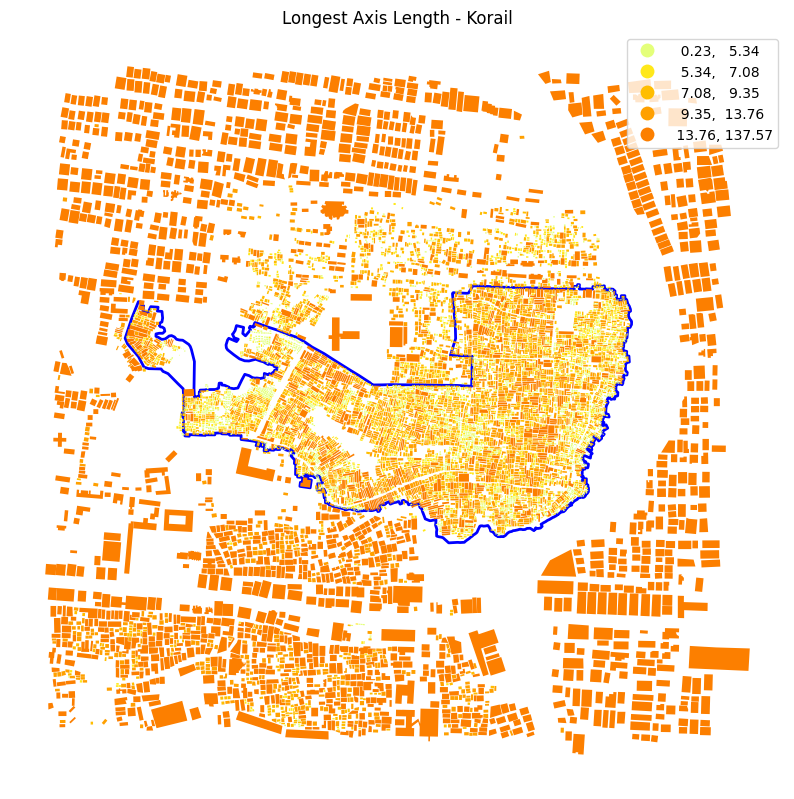

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='lal', legend=True, scheme='quantiles', cmap='Wistia')
plt.title('Longest Axis Length - Korail')
ax.set_axis_off()
plt.show()

## **SPATIAL DISTRIBUTION METRICS**

# Distance to neighbours buidlings

Caculates the distance to neighbours buildings through queen contiguity weights of the first order capturing the relationship between immediate neighbours.Relationship between buildings is here represented by relationships between their tessellation cells.

In [ ]:
sw1 = mm.sw_high(k=1, gdf=tessellation, ids='uID')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
buildings['neighbour_dist'] = mm.NeighborDistance(buildings, sw1, 'uID').series

  0%|          | 0/10709 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
buildings = buildings.dropna(subset=['neighbour_dist'])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


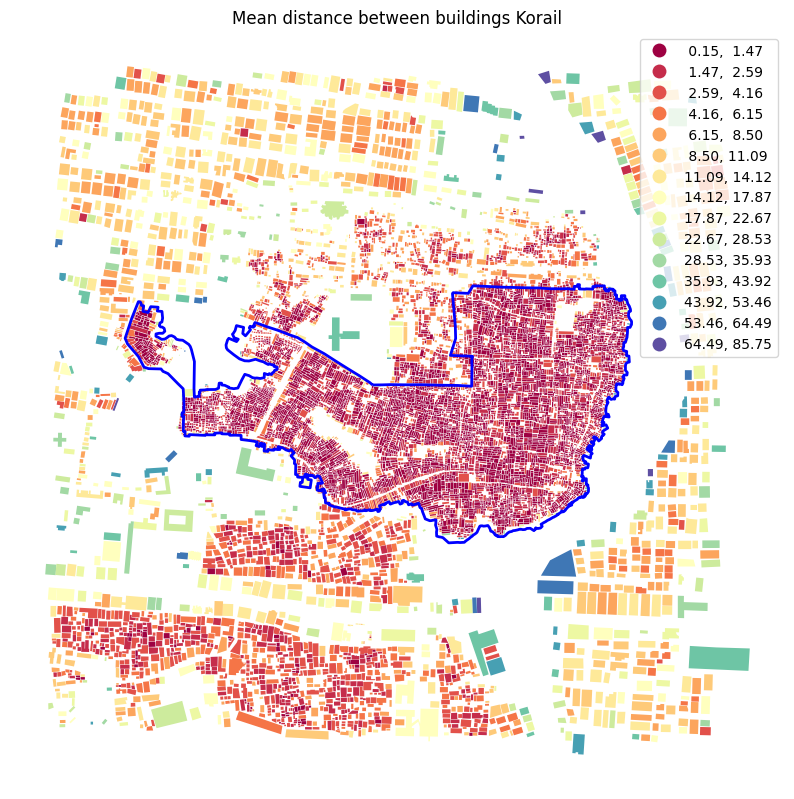

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
buildings.plot(ax=ax, column='neighbour_dist', scheme='naturalbreaks', k=15, legend=True, cmap='Spectral')
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
plt.title('Mean distance between buildings Korail')
ax.set_axis_off()
plt.show()

# Mean Interbuilding Distance

 Interbuilding distances are calculated between buildings on adjacent cells based on spatial_weights,

In [ ]:
MID = mm.MeanInterbuildingDistance(buildings, sw1,'uID')
buildings['mean_interbuilding_distance'] = MID.series


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Computing mean interbuilding distances...


  0%|          | 0/10698 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


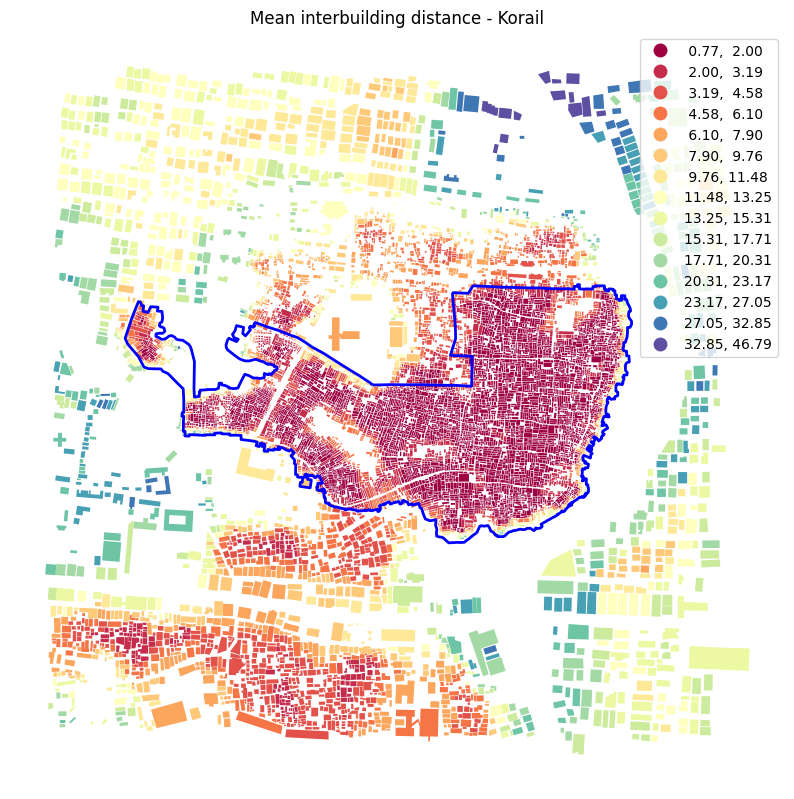

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
buildings.plot(ax=ax, column='mean_interbuilding_distance', scheme='naturalbreaks', k=15, legend=True, cmap='Spectral')
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
plt.title('Mean interbuilding distance - Korail')
ax.set_axis_off()
plt.show()

# **Orientation**

he deviation of orientation from cardinal directions are captured. Here ‘orientation’ is defined as an orientation of the longest axis of bounding rectangle in range 0 - 45.

In [ ]:
buildings['orientation'] = mm.Orientation(buildings).series
buildings['orientation'][0]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


  0%|          | 0/10698 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


2.518925929438012

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


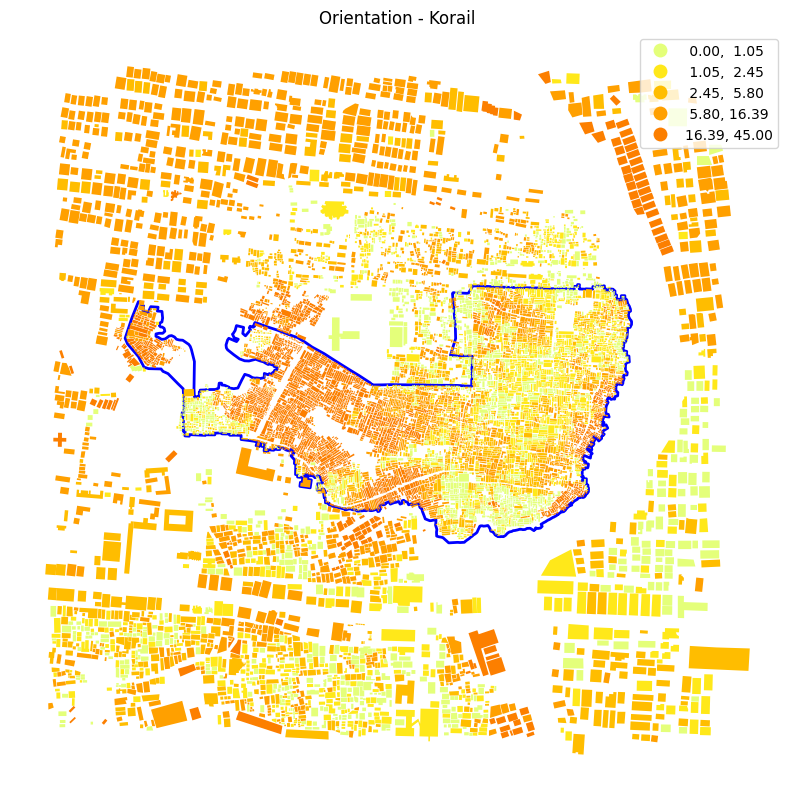

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='orientation', legend=True, scheme='quantiles', cmap='Wistia')
plt.title('Orientation - Korail')
ax.set_axis_off()
plt.show()

# Shared walls and its ratio

# Shared walls

In [ ]:
buildings['swr'] = mm.SharedWalls(buildings).series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/momepy/distribution.py:137: FutureWarning: The `query_bulk()` method is deprecated and will be removed in GeoPandas 1.0. You can use the `query()` method instead.
  inp, res = gdf.sindex.query_bulk(gdf.geometry, predicate="intersects")
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/mapclassify/classifiers.py:1592: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 2.
  self.bins = quantile(y, k=k)


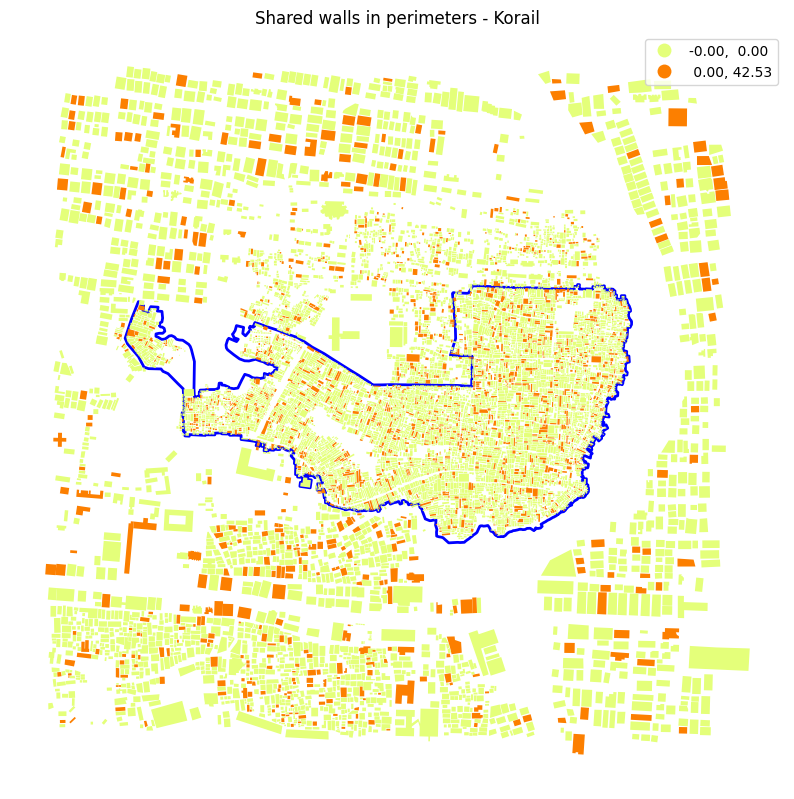

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='swr', legend=True, scheme='quantiles', cmap='Wistia')
plt.title('Shared walls in perimeters - Korail')
ax.set_axis_off()
plt.show()

# Ratio of shared walls

In [ ]:
buildings['swr'] = mm.SharedWallsRatio(buildings).series
buildings['swr'][10]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/momepy/distribution.py:137: FutureWarning: The `query_bulk()` method is deprecated and will be removed in GeoPandas 1.0. You can use the `query()` method instead.
  inp, res = gdf.sindex.query_bulk(gdf.geometry, predicate="intersects")
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super()

0.47391953759839806

/usr/local/lib/python3.10/dist-packages/mapclassify/classifiers.py:1592: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 2.
  self.bins = quantile(y, k=k)


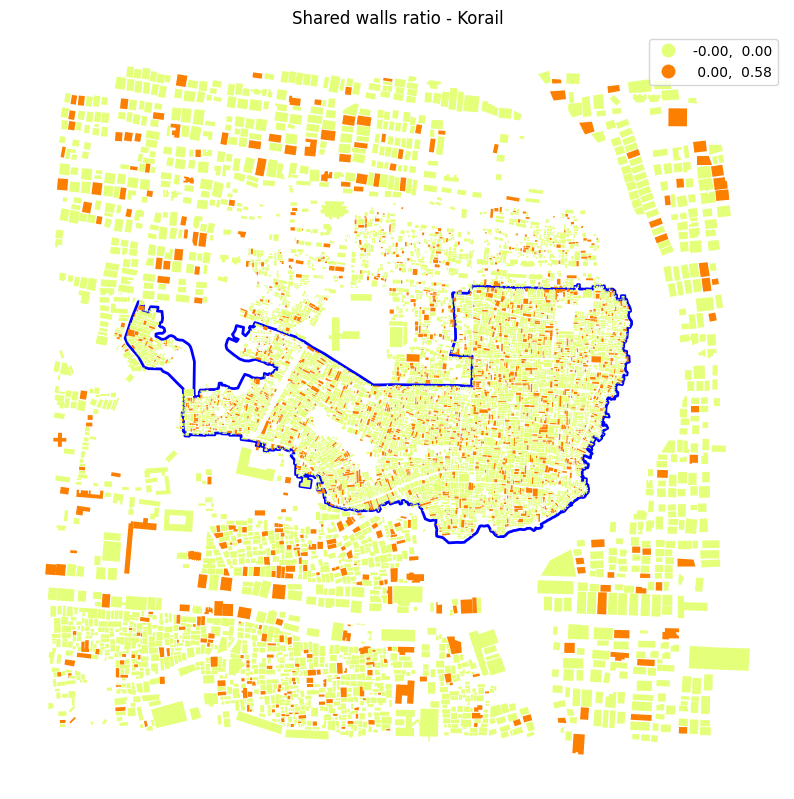

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='swr', legend=True, scheme='quantiles', cmap='Wistia')
plt.title('Shared walls ratio - Korail')
ax.set_axis_off()
plt.show()

## **SHAPE METRICS**

# Circular compactness

measures the ratio of object area to the area of its smallest circumsribed circle.
This ratio indicates how efficiently the object's area fills the smallest circumscribed circle.
Values closer to 1 indicating a shape more similar to a perfect circle.

In [ ]:
blg_cc = mm.CircularCompactness(buildings)
buildings['circular_com'] = blg_cc.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


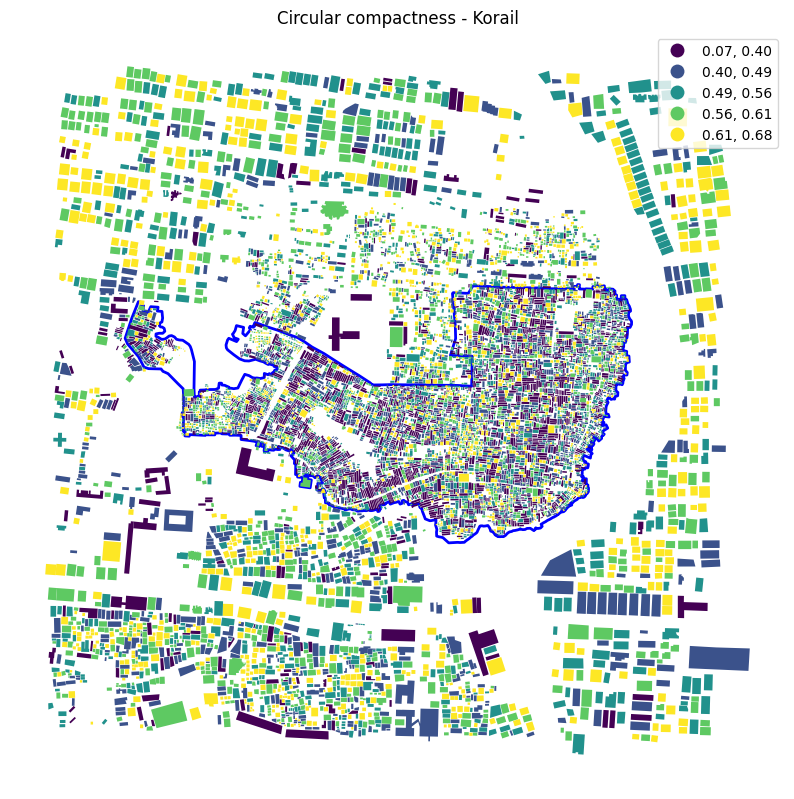

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='circular_com', scheme='quantiles', legend=True, cmap='viridis')
plt.title('Circular compactness - Korail')
ax.set_axis_off()
plt.show()

# Elongation

Elongation of its minimum bounding rectangle.
If the elongation is close to 1, the object is more or less square-shaped indicating little to no elongation.
If it is much greater than 1, the object is significantly elongated in one direction.

In [ ]:
blg_elongation = mm.Elongation(buildings)
buildings['elongation'] = blg_elongation.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


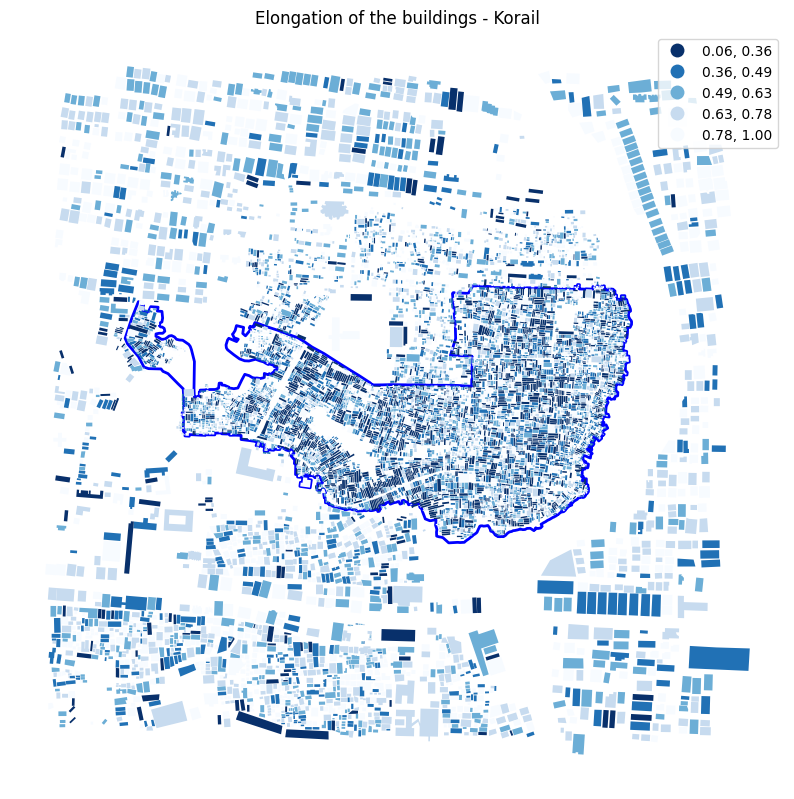

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='elongation', scheme='quantiles', legend=True, cmap='Blues_r')
plt.title('Elongation of the buildings - Korail')
ax.set_axis_off()
plt.show()

# Squareness

 Calculates the squareness of each building. It measures mean deviation of all corners from 90 degrees.

In [ ]:
blg_squareness = mm.Squareness(buildings)
buildings['squareness'] = blg_squareness.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


  0%|          | 0/10698 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


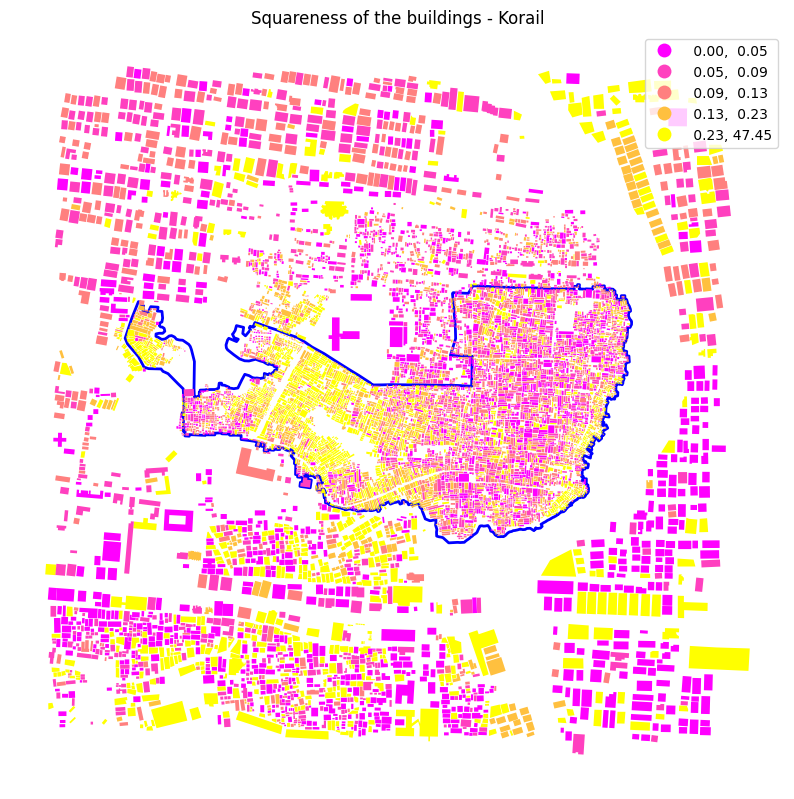

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='squareness', legend=True, scheme='quantiles', cmap='spring')
plt.title('Squareness of the buildings - Korail')
ax.set_axis_off()
plt.show()

# Cell shapes

Calculates the compactness-weighted axis of each tessellation


In [ ]:
tes_cwa = mm.CompactnessWeightedAxis(tessellation)
tessellation['cwa'] = tes_cwa.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


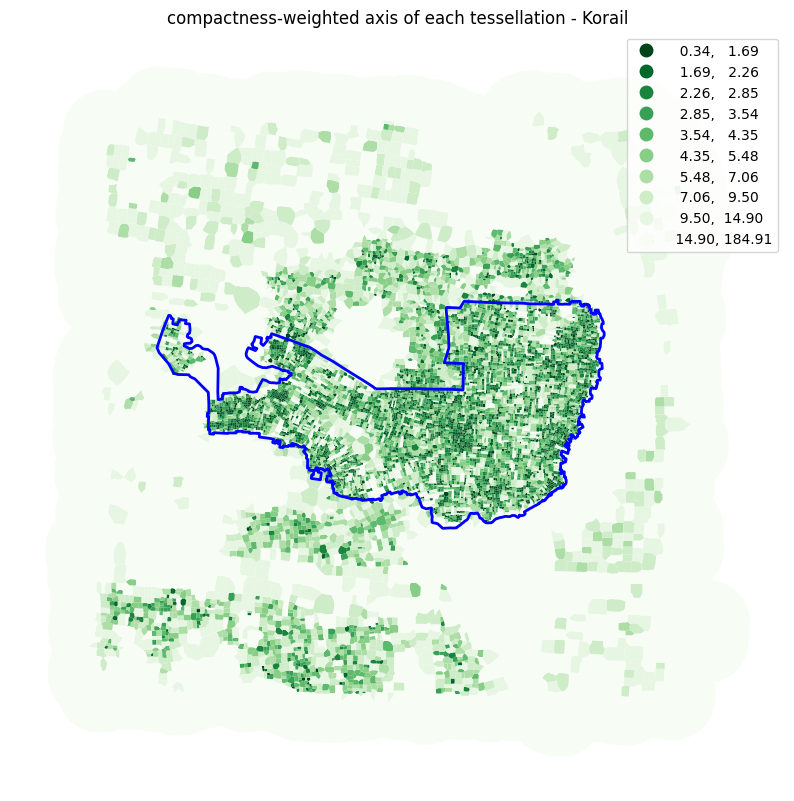

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))

tessellation.plot(ax=ax, column='cwa', legend=True, scheme='quantiles', k=10, cmap='Greens_r')
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
plt.title('compactness-weighted axis of each tessellation - Korail')
ax.set_axis_off()
plt.show()

# Equivalent rectangular index

Calculates the equivalent rectangular index of each object. Closer or more than 1 equals to less complexity of the polygon.

In [ ]:
buildings['eri'] = mm.EquivalentRectangularIndex(buildings, 'area', 'perimeter').series
buildings['eri'][0]
# ERI_buildings = mm.EquivalentRectangularIndex(buildings)
# buildings['eri'] = ERI_buildings.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


0.995962258113041

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


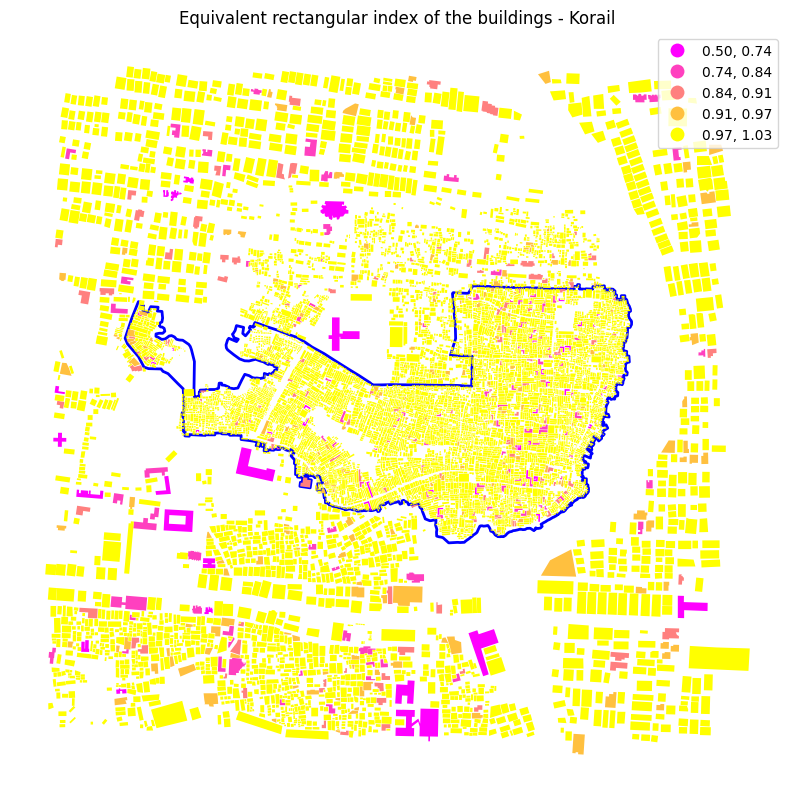

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='eri', legend=True, scheme='naturalbreaks', cmap='spring')
plt.title('Equivalent rectangular index of the buildings - Korail')
ax.set_axis_off()
plt.show()

# Fractal dimension

A fractal dimension greater than 1 for a 2-dimensional patch indicates a departure
from euclidean geometry (that is, an increase in shape complexity).

In [ ]:
buildings['fractal'] = mm.FractalDimension(buildings,'area', 'perimeter').series
buildings.fractal[0]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


1.027646024125731

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


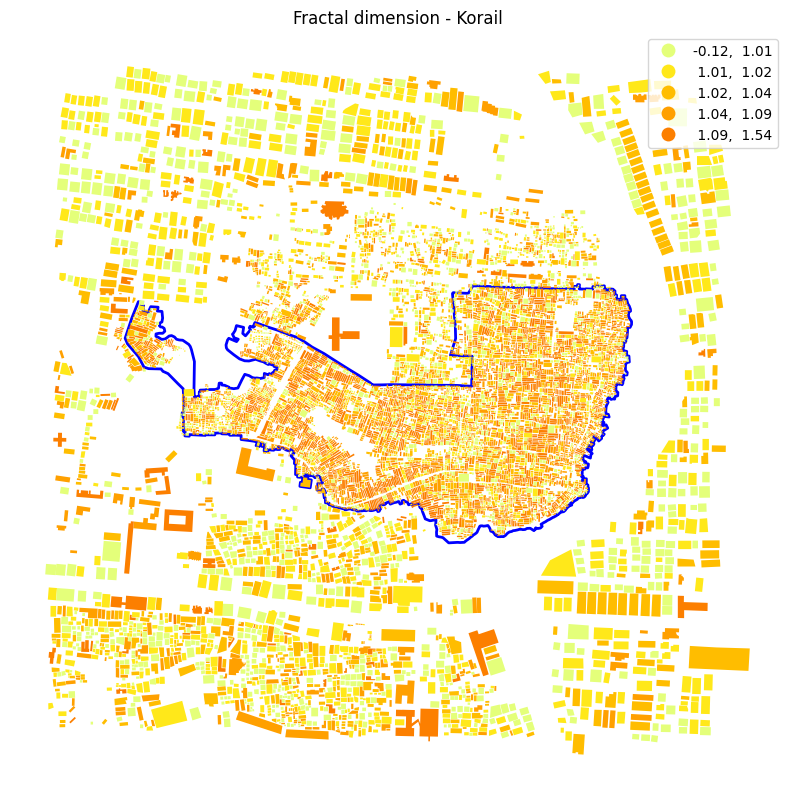

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='fractal', legend=True, scheme='quantiles', cmap='Wistia')
plt.title('Fractal dimension - Korail')
ax.set_axis_off()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity

# Define the first Series (tess_car series) with new values
tess_car_series = pd.Series({
    134: 0.055739,
    697: 0.387970,
    120: 0.601259,
    10178: 0.383726,
    718: 0.466501
})

# Define the second Series (tes_area series) with original values
tes_area_series = pd.Series({
    134: 18052.371237,
    697: 1445.738915,
    120: 1333.567369,
    10178: 956.003740,
    718: 1365.745887
})

# Print the Series to verify
print("tess_car series:")
print(tess_car_series)

print("\ntes_area series:")
print(tes_area_series)

# Convert series to numpy arrays and reshape
car_values = tess_car_series.to_numpy().reshape(1, -1)
area_values = tes_area_series.to_numpy().reshape(1, -1)

# Calculate cosine similarity
cos_sim = cosine_similarity(car_values, area_values)

# Output the cosine similarity
print("\nCosine Similarity:", cos_sim[0][0])

tess_car series:
134      0.055739
697      0.387970
120      0.601259
10178    0.383726
718      0.466501
dtype: float64

tes_area series:
134      18052.371237
697       1445.738915
120       1333.567369
10178      956.003740
718       1365.745887
dtype: float64

Cosine Similarity: 0.19717047842572114
